In [10]:
import os
import glob
import numpy as np
from skimage import io

# dataset_folder = '/data/datasets'
def load_source(train = 80000, valid = 400, test = 400, sig_rate = 0.035):
# 	train = 80000
# 	valid = 400
# 	test = 400
# 	sig_rate = 0.035
    sig_file = '/shared/planck/Phantom/Breast_Xray/FDA_signals/hetero_sig.dat'
    CLB_file = '/shared/rsaas/shenghua/CLB/CLB_128N_400000IM.npy'
# 	sig_file = os.path.join(dataset_folder, 'FDA_signals/hetero_sig.dat')
# 	CLB_file = os.path.join(dataset_folder, 'CLB/CLB_128N_400000IM.npy')
    sig = np.fromfile(sig_file, dtype = np.float32).reshape(109,109)
    data = np.load(CLB_file, mmap_mode='r')
    X = data[:,:,0:train+valid+test]
    X = np.transpose(np.reshape(X, [128, 128, train+valid+test], order='F'))
    X_SA_trn, X_SA_val, X_SA_tst = X[:train, 64-54:64+55,64-54:64+55], X[train:train+valid, 64-54:64+55,64-54:64+55],\
        X[train+valid:train+valid+test, 64-54:64+55,64-54:64+55]
    X_SP_trn, X_SP_val, X_SP_tst = X_SA_trn + sig * sig_rate, X_SA_val + sig * sig_rate, X_SA_tst + sig * sig_rate
    X_trn, X_val, X_tst = np.concatenate([X_SA_trn, X_SP_trn]), np.concatenate([X_SA_val, X_SP_val]), np.concatenate([X_SA_tst, X_SP_tst])
    y_trn = np.concatenate([np.zeros((train,1)), np.ones((train,1))]).flatten()
    y_val = np.concatenate([np.zeros((valid,1)), np.ones((valid,1))]).flatten()
    y_tst = np.concatenate([np.zeros((test,1)), np.ones((test,1))]).flatten()

    return X_trn, X_val, X_tst, y_trn, y_val, y_tst

def load_target(dataset = 'total', train = 80000, valid = 400, test = 400):
# 	dataset = 'total'
# 	train = 80000
# 	valid = 400
# 	test = 400
# 	X_SA = np.load('/shared/planck/Phantom/Breast_Xray/FDA_DM_ROIs/npy_dataset/{}_SA.npy'.format(dataset))
# 	X_SP = np.load('/shared/planck/Phantom/Breast_Xray/FDA_DM_ROIs/npy_dataset/{}_SP.npy'.format(dataset))
    dataset_folder = '/shared/planck/Phantom/Breast_Xray/'
    if dataset == 'dense':
        offset_valid = 7100
    elif dataset == 'hetero':
        offset_valid = 36000
    elif dataset == 'scattered':
        offset_valid = 33000
    elif dataset == 'fatty':
        offset_valid = 9000
    elif dataset == 'total':
        offset_valid = 85000
    offset_test = 400 + offset_valid
    X_SA = np.load(os.path.join(dataset_folder, 'FDA_DM_ROIs/npy_dataset/{}_SA.npy'.format(dataset)))
    X_SP = np.load(os.path.join(dataset_folder, 'FDA_DM_ROIs/npy_dataset/{}_SP.npy'.format(dataset)))
    X_SA_trn, X_SA_val, X_SA_tst = X_SA[:train,:], X_SA[offset_valid:offset_valid+valid,:], X_SA[offset_test:offset_test+test,:]
    X_SP_trn, X_SP_val, X_SP_tst = X_SP[:train,:], X_SP[offset_valid:offset_valid+valid,:], X_SP[offset_test:offset_test+test,:]
    X_trn, X_val, X_tst = np.concatenate([X_SA_trn, X_SP_trn]), np.concatenate([X_SA_val, X_SP_val]), np.concatenate([X_SA_tst, X_SP_tst])
    y_trn = np.concatenate([np.zeros((train,1)), np.ones((train,1))]).flatten()
    y_val = np.concatenate([np.zeros((valid,1)), np.ones((valid,1))]).flatten()
    y_tst = np.concatenate([np.zeros((test,1)), np.ones((test,1))]).flatten()
    print('---- Dataset Summary: {} ----'.format(dataset))
    print(' -all SA {}, SP {}'.format(X_SA.shape[0], X_SP.shape[0]))
    print(' -trn SA {}, SP {}'.format(X_SA_trn.shape[0], X_SP_trn.shape[0]))
    print(' -val SA {}, SP {}'.format(X_SA_val.shape[0], X_SP_val.shape[0]))
    print(' -val SA {}, SP {}'.format(X_SA_tst.shape[0], X_SP_tst.shape[0]))
    # 	print('\n')
    return X_trn, X_val, X_tst, y_trn, y_val, y_tst

In [5]:
# load source data
noise = 2.0
sig_rate = 0.035
nb_source = 400
Xs_trn, Xs_val, Xs_tst, ys_trn, ys_val, ys_tst = load_source(train = nb_source, sig_rate = sig_rate)
Xs_trn, Xs_val, Xs_tst = np.random.RandomState(2).normal(Xs_trn, noise), np.random.RandomState(0).normal(Xs_val, noise), np.random.RandomState(1).normal(Xs_tst, noise)
Xs_trn, Xs_val, Xs_tst = (Xs_trn-np.min(Xs_trn))/(np.max(Xs_trn)-np.min(Xs_trn)), (Xs_val-np.min(Xs_val))/(np.max(Xs_val)-np.min(Xs_val)), (Xs_tst-np.min(Xs_tst))/(np.max(Xs_tst)-np.min(Xs_tst))
# load target data
dataset = 'total'
if dataset == 'dense':
    nb_target = 7100
elif dataset == 'hetero':
    nb_target = 36000
elif dataset == 'scattered':
    nb_target = 33000
elif dataset == 'fatty':
    nb_target = 9000
elif dataset == 'total':
    nb_target = 1000
Xt_trn, Xt_val, Xt_tst, yt_trn, yt_val, yt_tst = load_target(dataset = dataset, train = nb_target, valid = 100)
Xt_trn, Xt_val, Xt_tst = (Xt_trn-np.min(Xt_trn))/(np.max(Xt_trn)-np.min(Xt_trn)), (Xt_val-np.min(Xt_val))/(np.max(Xt_val)-np.min(Xt_val)), (Xt_tst-np.min(Xt_tst))/(np.max(Xt_tst)-np.min(Xt_tst))

KeyboardInterrupt: 

In [4]:
# generate the folder
def generate_folder(folder):
    import os
    if not os.path.exists(folder):
        os.makedirs(folder)

In [8]:
import matplotlib.pyplot as plt
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    SMALL_SIZE = 15
    MEDIUM_SIZE = 18
    BIGGER_SIZE = 24

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    return ax

In [5]:
Xs = np.concatenate([Xs_trn, Xs_val]); ys  = np.concatenate([ys_trn, ys_val])
Xt = np.concatenate([Xt_trn, Xt_val]); yt  = np.concatenate([yt_trn, yt_val])

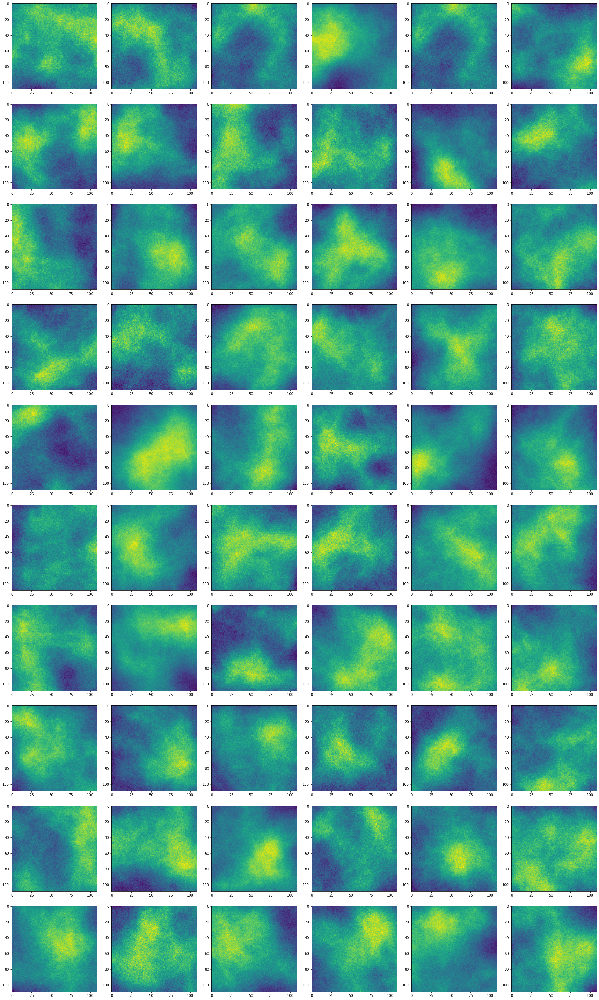

In [6]:
nb_images = 60
image_ids = np.random.randint(0,Xs.shape[0],nb_images)
# print(image_ids)
rows, cols = 10, 6
ax = get_ax(rows = rows, cols = cols, size = 4)
for i in range(rows):
    for j in range(cols):
        ax[i,j].imshow(Xs[image_ids[i*cols+j],:,:])

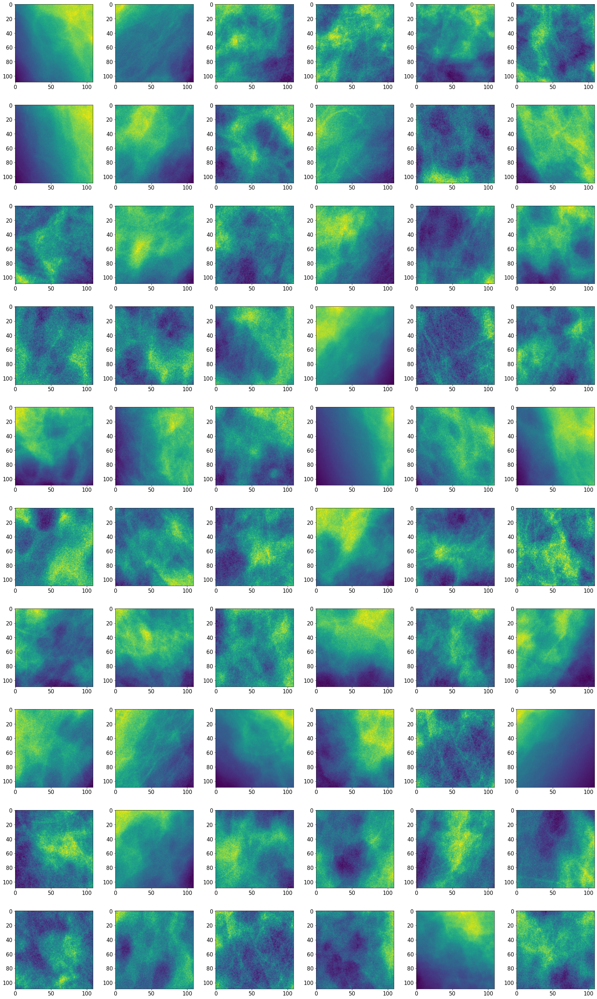

In [7]:
nb_images = 60
image_ids = np.random.randint(0,Xt.shape[0],nb_images)
rows, cols = 10, 6
ax = get_ax(rows = rows, cols = cols, size = 4)
for i in range(rows):
    for j in range(cols):
        ax[i,j].imshow(Xt[image_ids[i*cols+j],:,:])

(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(109, 109, 3)
255
(10, 109, 109, 3)
Mean:199.9045871559633, STD:21.22548401376399


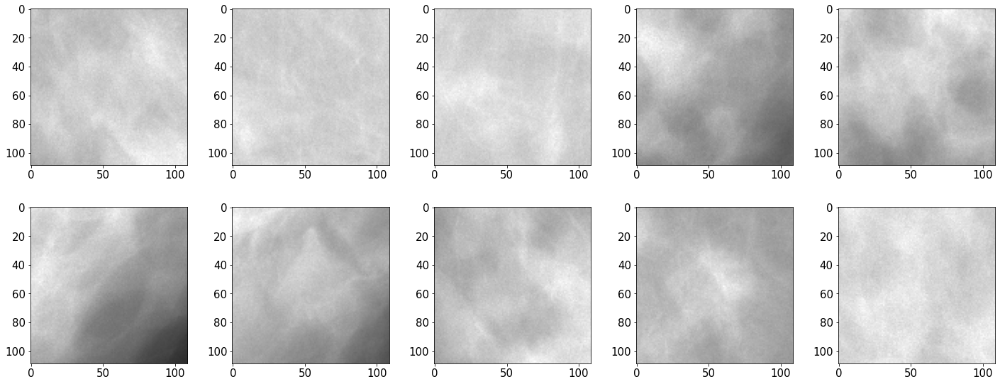

In [8]:
nb_images = 10
image_ids = np.random.randint(0,Xt.shape[0],nb_images)
rows, cols = 2, 5
ax = get_ax(rows = rows, cols = cols, size = 4)
image_list = []
for i in range(rows):
    for j in range(cols):
        image = Xt[image_ids[i*cols+j],:,:]; rgb_img = np.stack([image,image,image],axis=2);
        print(rgb_img.shape)
        rgb_img = np.uint8(rgb_img/rgb_img.max()*255.)
        print(rgb_img.max())
        ax[i,j].imshow(rgb_img); image_list.append(rgb_img)
image_arr = np.stack(image_list,axis = 0)
print(image_arr.shape)
print('Mean:{}, STD:{}'.format(np.mean(image_arr[:,:,0]), np.std(image_arr[:,:,0])))

In [11]:
dataset_folder = '/home/sh38/domain_adaptation/CDAN/data/clb-fda/'
source_folder = dataset_folder+'clb/'; target_folder = dataset_folder +'fda/'
generate_folder(source_folder); generate_folder(target_folder)
# Xs = np.concatenate([Xs_trn, Xs_val, Xs_tst]); ys  = np.concatenate([ys_trn, ys_val, ys_tst])
# Xt = np.concatenate([Xt_trn, Xt_val, Xt_tst]); ys  = np.concatenate([yt_trn, yt_val, yt_tst])
indices_s = np.random.permutation(Xs.shape[0])
print(indices_s.shape)
data_list_file = dataset_folder+'clb_list.txt'
if os.path.exists(data_list_file):
    os.system('rm -f {}'.format(data_list_file))
print(Xs.shape[0])

with open(data_list_file, 'w+') as f:
    for i in range(Xs.shape[0]):
        image = Xs[indices_s[i],:,:]; rgb_img = np.stack([image,image,image],axis=2);
        rgb_img = np.uint8(rgb_img/rgb_img.max()*255.)
        image_file_path = source_folder+'{:05d}.png'.format(indices_s[i])
        io.imsave(image_file_path,rgb_img)
        f.write(image_file_path+ ' {}\n'.format(int(ys[indices_s[i]])))

indices_t = np.random.permutation(Xt.shape[0])
print(indices_t.shape)

data_list_file = dataset_folder+'fda_list.txt'
if os.path.exists(data_list_file):
    os.system('rm -f {}'.format(data_list_file))
print(Xt.shape[0])

with open(data_list_file, 'w+') as f:
    for i in range(Xt.shape[0]):
        image = Xt[indices_t[i],:,:]; rgb_img = np.stack([image,image,image],axis=2);
        rgb_img = np.uint8(rgb_img/rgb_img.max()*255.)
        image_file_path = target_folder+'{:05d}.png'.format(indices_t[i])
        io.imsave(image_file_path,rgb_img)
        f.write(image_file_path+ ' {}\n'.format(int(ys[indices_t[i]])))

(2800,)
2800
(2200,)
2200


255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
255
0
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/030400.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/136407.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/166420.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/078441.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/180758.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/049428.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/093584.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/187756.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/019976.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/106732.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/104188.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/100846.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/154379.png
/home/sh38/domain_adaptation/CDAN/data/fda-2/clb/187881.png
/home/sh38/domain_adaptation/CDAN/data/f

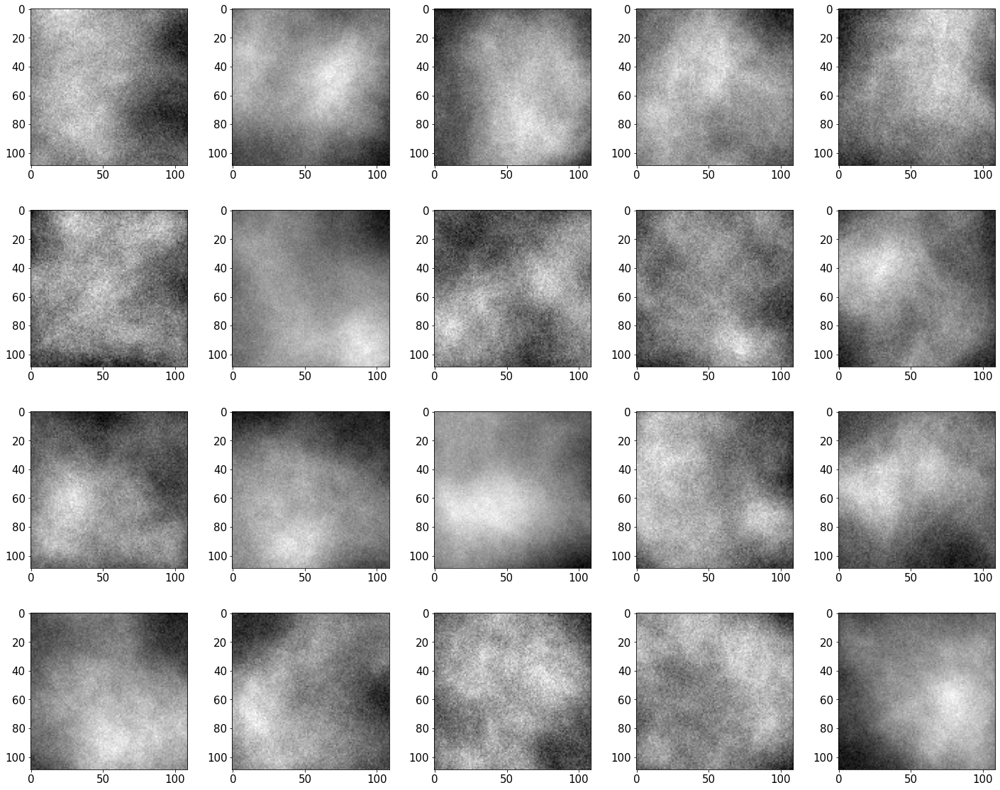

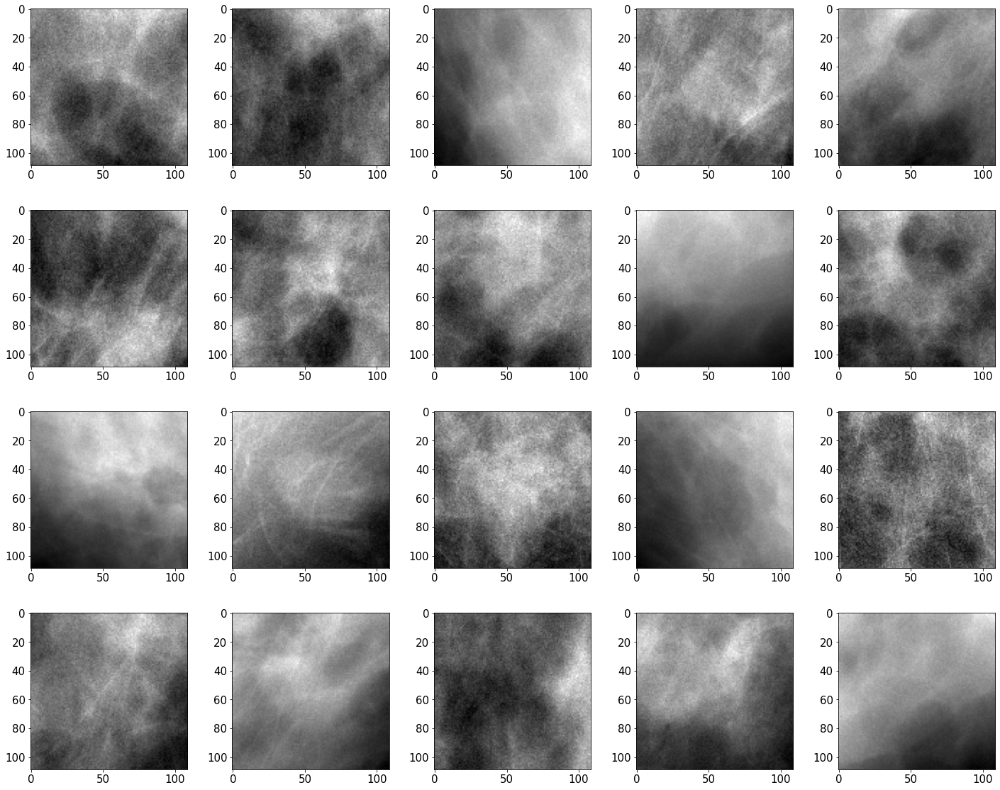

In [17]:
## check the image set
dataset_folder = '/home/sh38/domain_adaptation/CDAN/data/fda-2/'
source_folder = dataset_folder+'clb/'; target_folder = dataset_folder +'fda/'
source_img_files = glob.glob(source_folder+'*.png')
target_img_files = glob.glob(target_folder +'*.png')
nb_images = 20
source_indices = np.random.randint(0,len(source_img_files), nb_images)
target_indices = np.random.randint(0,len(target_img_files), nb_images)
ax = get_ax(rows = 4, cols = 5, size = 4)
for i in range(4):
    for j in range(5):
        image = io.imread(source_img_files[source_indices[i*cols+j]])
        ax[i,j].imshow(image); print(image.max()); print(image.min())
for i in range(4):
    for j in range(5):
        print(source_img_files[source_indices[i*cols+j]])
ax = get_ax(rows = 4, cols = 5, size = 4)
for i in range(4):
    for j in range(5):
        ax[i,j].imshow(io.imread(target_img_files[target_indices[i*cols+j]]))

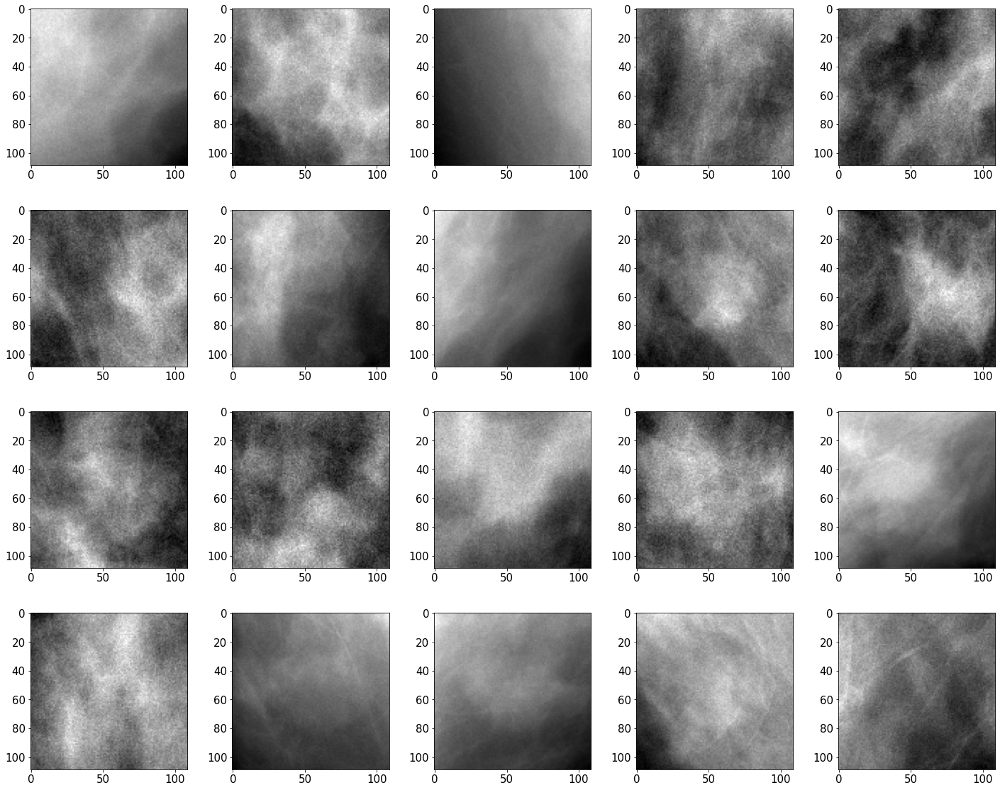

In [12]:
## check the test target images
dataset_folder = '/home/sh38/domain_adaptation/CDAN/data/fda-2/'
target_folder = dataset_folder +'fda_tst/'
target_img_files = glob.glob(target_folder +'*.png')
nb_images = 20
target_indices = np.random.randint(0,len(target_img_files), nb_images)
rows = 4; cols = 5
ax = get_ax(rows = 4, cols = 5, size = 4)
for i in range(4):
    for j in range(5):
        ax[i,j].imshow(io.imread(target_img_files[target_indices[i*cols+j]]))